In [1]:
import emcee
import corner
import speclite as speclite; from speclite import filters
from tqdm import tqdm
from matplotlib import cm
from matplotlib.artist import Artist
from chromatic import *
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from PyAstronomy import pyasl
from specutils.spectra import Spectrum1D, SpectralRegion
from specutils.fitting import fit_generic_continuum

In [3]:
bandpass=np.linspace(3800.,10000.,400)*u.angstrom

#response functions

gp_data = np.loadtxt('../data/filter_curves/SDSS.gp.txt')
gp_response = gp_data[:,1]
gp_response[gp_response<0] = 0
gp_response[-1] = 0
rp_data = np.loadtxt('../data/filter_curves/SDSS.rp.txt')
rp_response = rp_data[:,1]
rp_response[rp_response<0] = 0
rp_response[-1] = 0
ip_data = np.loadtxt('../data/filter_curves/SDSS.ip.txt')
ip_response = ip_data[:,1]
ip_response[ip_response<0] = 0
ip_response[-1] = 0
LCO_gp = speclite.filters.FilterResponse(
    wavelength = gp_data[:,0]*10 * u.Angstrom,
    response = gp_response, meta=dict(group_name='sdss', band_name='gp'))
LCO_rp = speclite.filters.FilterResponse(
    wavelength = rp_data[:,0]*10 * u.Angstrom,
    response = rp_response, meta=dict(group_name='sdss', band_name='rp'))
LCO_ip = speclite.filters.FilterResponse(
    wavelength = ip_data[:,0]*10 * u.Angstrom,
    response = ip_response, meta=dict(group_name='sdss', band_name='ip'))

sdss_responses = speclite.filters.load_filters('sdss-gp','sdss-rp','sdss-ip')
response_g = sdss_responses[0].interpolator(bandpass)
response_r = sdss_responses[1].interpolator(bandpass)
response_i = sdss_responses[2].interpolator(bandpass)

## Spectrum normalization functions

In [4]:
def normalize_nres(data_flux,wavelength=None,**kwargs):
    
    flux = data_flux * u.erg
    
    _m = flux/np.nanmedian(flux)
    spectrum = Spectrum1D(flux=_m, spectral_axis=wavelength)
    with warnings.catch_warnings():  # Ignore warnings
        warnings.simplefilter('ignore')
        g1_fit = fit_generic_continuum(spectrum)
        continuum_fit = g1_fit(wavelength)
        
    normed_flux = _m/continuum_fit
    
    return normed_flux

In [49]:
def normalized_1T_PHOENIX(Tspec=3650,wavelength=None,**kwargs):
        
    _model = get_phoenix_photons(temperature=float(Tspec),wavelength=wavelength,
                                 logg=4.4, metallicity=0.0)
    
    _m = _model[1]/np.nanmedian(_model[1])
    spectrum = Spectrum1D(flux=_m, spectral_axis=_model[0])
    with warnings.catch_warnings():  # Ignore warnings
        warnings.simplefilter('ignore')
        g1_fit = fit_generic_continuum(spectrum)
        continuum_fit = g1_fit(_model[0])
        
    normed_model = _m/continuum_fit
    
    return normed_model

In [50]:
def normalized_2T_PHOENIX(spot_params=[0.3,0.06,3000.,3900.],wavelength = None,
                          spotspec=None,ambspec=None, **kwargs):
    
    f_spot,df_spot,T_spot, T_amb = spot_params
    
    _m = f_spot*spotspec[1] + (1.-f_spot)*ambspec[1]
    normed_spec = _m/np.nanmedian(_m)
    spectrum = Spectrum1D(flux=normed_spec, spectral_axis=wavelength)
    with warnings.catch_warnings():  # Ignore warnings
        warnings.simplefilter('ignore')
        g1_fit = fit_generic_continuum(spectrum)
        continuum_fit = g1_fit(wavelength)
    model = normed_spec/continuum_fit
    
    return model

## Photometric variability model

In [51]:
def photometric_variability_model(parameters=None,plot=False,
                                  samples_exist=False,samples=None,
                                  label=None,title=None,
                                  **kwargs):
    
    f_spot,df_spot,T_spot,T_amb = parameters
    bandpass=np.linspace(3800.,10000.,400)*u.angstrom

    spotflux = get_phoenix_photons(temperature=int(T_spot), wavelength = bandpass,logg=4.4, metallicity=0.0)[1]
    ambflux = get_phoenix_photons(temperature=int(T_amb), wavelength = bandpass,logg=4.4, metallicity=0.0)[1]
    this_model_spectrum = f_spot*spotflux + (1.0-f_spot)*ambflux
                     
    d_lambda = (bandpass[1]-bandpass[0])
    contrast = 1.-(spotflux/ambflux)
    ds_over_s = -df_spot * ( contrast / ( 1.-f_spot * contrast ) )
    semi_amplitude = np.abs(ds_over_s)

    numerator = np.nansum(semi_amplitude*this_model_spectrum*response_g*d_lambda)
    denominator = np.nansum(this_model_spectrum*response_g*d_lambda)
    modelgp = numerator/denominator

    numerator = np.nansum(semi_amplitude*this_model_spectrum*response_r*d_lambda)
    denominator = np.nansum(this_model_spectrum*response_r*d_lambda)
    modelrp = numerator/denominator

    numerator = np.nansum(semi_amplitude*this_model_spectrum*response_i*d_lambda)
    denominator = np.nansum(this_model_spectrum*response_i*d_lambda)
    modelip = numerator/denominator

    model = np.array([modelgp,modelrp,modelip, modelgp,modelrp])
    model_coords = [4750,6200,7550, 4750,6200]
    w_err = [700,600,700, 700,600]
    phot_data = np.array([0.075,0.075,0.050, 0.076,0.076])
    phot_errs = np.array([0.005,0.005,0.006, 0.004,0.004])

    chisq = np.nansum((phot_data - model)**2./(phot_errs)**2.)
    err_weight = np.nansum(1./np.sqrt(2.*np.pi*(phot_errs)))
    ln_like = (err_weight - 0.5*chisq)
    
    if plot:
        fig, ax1 = plt.subplots(figsize=(8,5))
        ax1.set_title(f'{title}',fontsize=16,loc='left')
        ax1.set_xlabel(r'Wavelength $\AA$',fontsize=20)
        ax1.set_ylabel(r'$\frac{\Delta S(\lambda)}{S_{\rm avg}}$',fontsize=22)
        if samples_exist:
            fspot_sam, dfspot_sam, Tspot_sam, Tamb_sam = samples
            sig1_fspot = np.percentile(fspot_sam, [15.9, 50., 84.1]) # central 1-sigma values
            sig1_dfspot = np.percentile(dfspot_sam, [15.9, 50., 84.1])
            sig1_Tspot = np.percentile(Tspot_sam, [15.9, 50., 84.1])
            sig1_Tamb = np.percentile(Tamb_sam, [15.9, 50., 84.1])
            best_params = np.array([sig1_fspot[1], sig1_dfspot[1], sig1_Tspot[1], sig1_Tamb[1]])
            for k in range(0,1000):
                i = np.random.randint(low=0,high=(len(Tamb_sam)-1))
                ds_spot = get_phoenix_photons(temperature=Tspot_sam[i], wavelength = bandpass,
                                                               logg=4.4, metallicity=0.0)[1]
                ds_amb = get_phoenix_photons(temperature=Tamb_sam[i], wavelength = bandpass,
                                                               logg=4.4, metallicity=0.0)[1]
                _contrast = 1.-(ds_spot/ds_amb)
                _ds_over_s = -dfspot_sam[i] * ( _contrast / ( 1.-fspot_sam[i] * _contrast ) )
                _semi_amplitude = np.abs(_ds_over_s)
                ax1.plot(bandpass, _semi_amplitude, zorder=0, alpha=0.02, color='deepskyblue')

        ax1.errorbar(model_coords[:3],phot_data[:3],xerr=w_err[:3],yerr=phot_errs[:3],color='black',label='F21',fmt='none',zorder=1000,linewidth=2)
        ax1.errorbar(model_coords[3:],phot_data[3:],xerr=w_err[3:],yerr=phot_errs[3:],color='red',label='S22',fmt='none',zorder=1000,linewidth=2)
        ax1.set_xlim(3800,8500)
        ax1.set_ylim(0,0.11)
        ax1.legend(loc='lower right')

        ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
        ax2.fill_between(bandpass.value, 0, response_g/np.nanmax(response_g),color='orange',
                         zorder=-100,label='SDSS g filter response',alpha=0.3)
        ax2.fill_between(bandpass.value, 0, response_r/np.nanmax(response_r),color='teal',
                         zorder=-100,label='SDSS r filter response',alpha=0.3)
        ax2.fill_between(bandpass.value, 0, response_i/np.nanmax(response_i),color='purple',
                         zorder=-100,label='SDSS i filter response',alpha=0.3)
        ax2.set_ylabel('Filter Response',fontsize=20)
        ax2.set_ylim(0,1.1)

        ax2.legend(loc='lower left')

        plt.savefig(f'../figs/{label}_photmodel.png',dpi=200)
        plt.show()
    
    return model, ln_like

## Spectral model

In [52]:
def average_spectrum_model(parameters=[0.35,0.07,3000.,3900.],
                           data_flux=None, data_err=None,
                           wavelength=None,plot=False,ref_w=None,
                                  samples_exist=False,samples=None,
                                  label=None,title=None,**kwargs):
    
    S_spot = get_phoenix_photons(temperature=int(parameters[2]),wavelength=wavelength,
                                    logg=4.4,metallicity=0.0)
    S_amb = get_phoenix_photons(temperature=int(parameters[3]),wavelength=wavelength,
                                   logg=4.4,metallicity=0.0)

    model = normalized_2T_PHOENIX(spot_params=parameters,wavelength = wavelength,
                                  spotspec=S_spot,ambspec=S_amb)
    
    chisq = np.nansum((data_flux-model)**2/(data_err**2))
    err_weight = np.nansum(1./np.sqrt(2.*np.pi*(data_err)))
    ln_like = (err_weight - 0.5*chisq)
    
    if plot:
        fig, [ax0,ax1] = plt.subplots(2,1,figsize=(8,5),sharex=True,gridspec_kw=dict(height_ratios=[1,0.3]))
        fig.suptitle(f'{title}',fontsize=20)

        # Top plot, the processed data and combined model
        ax0.plot(wavelength, model, label = 'Spotted spectral model',color='k',zorder=100)
        # ax0.errorbar(ref_r.wavelength,ref_r.flux[:,2], yerr=ref_r.uncertainty[:,2], zorder=-1000,color='gray',
        #              label='Unprocessed NRES Spectrum',fmt='',alpha=0.2)
        ax0.errorbar(wavelength, data_flux, yerr=data_err, zorder=-100,color='teal',
                     label='NRES time-averaged spectrum',fmt='',alpha=1)
        ax0.set_ylim(0.25,1.5)
        ax0.set_ylabel('Relative Flux',fontsize=18)
        ax0.legend(loc='upper right',fontsize=14)
        # The middle plot, residuals of the above data and model
        ax1.errorbar(wavelength,(data_flux-model)/(data_err),
                     yerr=1,label='Residual',color='k',zorder=100)
        ax1.set_ylabel(r'Residual ($\sigma$)',fontsize=18)
        ax1.set_ylim(-5,5)
        # ax1.legend(loc='lower right')
        # ax1.axhspan(-1,1,color='red',alpha=0.2,zorder=10)
        # ax1.axhspan(-2,2,color='green',alpha=0.2,zorder=0)
        # ax1.axhspan(-3,3,color='gray',alpha=0.3,zorder=-10)
        ax1.set_xlim(ref_w[0],ref_w[-1])
        ax1.axhline(0)

        if samples_exist:
            fspot_sam, dfspot_sam, Tspot_sam, Tamb_sam = samples  
            for k in range(0,100):
                i = np.random.randint(low=0,high=(len(Tamb_sam)-1))
                S_spot = get_phoenix_photons(temperature=Tspot_sam[i], wavelength = wavelength,
                                                               logg=4.4, metallicity=0.0)
                S_amb = get_phoenix_photons(temperature=Tamb_sam[i], wavelength = wavelength,
                                                               logg=4.4, metallicity=0.0)
                _combined = fspot_sam[i]*S_spot[1] + (1.-fspot_sam[i])*S_amb[1]
                spectrum = Spectrum1D(flux=_combined/np.nanmedian(_combined), spectral_axis=S_spot[0])
                with warnings.catch_warnings():  # Ignore warnings
                    warnings.simplefilter('ignore')
                    g1_fit = fit_generic_continuum(spectrum)
                    continuum_fit = g1_fit(S_spot[0])
                _model = _combined/np.nanmedian(_combined)/continuum_fit
                ax0.plot(wavelength, _model, zorder=10, alpha=0.02, color='firebrick')

        plt.savefig(f'../figs/{label}_specmodel.png',dpi=100)
        # plt.show()
        # plt.close()
    
    return model, ln_like

## Define the log probability

In [53]:
def lnprob(parameters=None,**kwargs):

    f_spot,df_spot,T_spot,T_amb = parameters

    if (0.0<=f_spot<=0.5) and (0.<df_spot<f_spot) and (2300.1<=T_spot<=6000.0) and (2300.1<=T_amb<=6000.0):

        ln_like=0.0
        
        "Teff likelihood"
        if do_Teff:
            Teff_model = (f_spot*(T_spot**4.) + (1.-f_spot)*(T_amb**4.))**(1./4.)    
            chisq_Teff = (3650. - Teff_model)**2./(150.)**2.
            err_weight_Teff = 1./np.sqrt(2.*np.pi*(150.))
            ln_like += (err_weight_Teff - 0.5*chisq_Teff)
            
        "Combined phot variability likelihood"
        if do_Combined_Photometry:
            ln_like += photometric_variability_model(parameters=parameters)[1]

        "Combined visit likelihood"
        if do_CombinedSpec:
            for order in good_orders:
                F21_wave = NRES_Spectra['F21'][f'{order}']['w']
                F21_spec = NRES_Spectra['F21'][f'{order}']['f']
                F21_err = NRES_Spectra['F21'][f'{order}']['e']

                S22_wave = NRES_Spectra['S22'][f'{order}']['w']
                S22_spec = NRES_Spectra['S22'][f'{order}']['f']
                S22_err = NRES_Spectra['S22'][f'{order}']['e']
                
                ln_like_F21 = average_spectrum_model(parameters=parameters, wavelength=F21_wave,
                                                       data_flux=F21_spec, data_err=F21_err)[1]
                ln_like_S22 = average_spectrum_model(parameters=parameters,wavelength=S22_wave,
                                                       data_flux=S22_spec,data_err=S22_err)[1]
                ln_like += ln_like_F21
                ln_like += ln_like_S22                

    else:
        ln_like = -np.inf

    return ln_like

## Make a wrapper for the sampler

In [54]:
def do_mcmc(label='oops you didnt label your samples :sadface:',
            nsteps=100,burnin=25,ndim=4,nwalkers=100,**kwargs):
    
    # these are initial parameters
    fspot_init = np.random.uniform(0.2, 0.45, nwalkers)
    dfspot_init = np.random.uniform(0.03, 0.1, nwalkers)
    Tspot_init = np.random.uniform(2700, 3400, nwalkers)
    Tamb_init = np.random.uniform(3700, 3900, nwalkers)
    p0 = np.transpose([fspot_init, dfspot_init, Tspot_init, Tamb_init])

    # set up file saving for the samples when finished
    filename = f"../data/samples/{label}.h5"
    backend = emcee.backends.HDFBackend(filename)
    backend.reset(nwalkers, ndim)
    # Initialize and run the sampler
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, backend=backend)
    result = sampler.run_mcmc(p0, nsteps,store=True, progress=True)
    samples = sampler.chain[:, burnin:, :].reshape((-1, ndim)).T

    for i in range(len(samples)):
        tau_f = emcee.autocorr.integrated_time(samples[i])
        print('(Nsteps-burnin)*nwalkers/tau=',(nsteps-burnin)*nwalkers/tau_f)
    
    return samples

## Make a dictionary of spectra

In [58]:
NRES_Spectra = {
    
    "F21" : {
        
        "53" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "54" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "55" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "58" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "59" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "60" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "61" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "62" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "63" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "71" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "72" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "76" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "77" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "81" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "82" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        }      
    },
    
    "S22" : {
        "53" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "54" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "55" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "58" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "59" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "60" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "61" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "62" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "63" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "71" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "72" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "76" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "77" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "81" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        },
        "82" : {
            "w" : None,"f" : None,"e" : None, "ref_w" : None,
        }      
    }
}

In [59]:
good_orders = np.array([53,54,55,58,59,60,61,71,76,77,81,82])

for visit in tqdm(['F21','S22']):
    for order in tqdm(good_orders):
        _r = read_rainbow(f"../data/rainbows/{visit}_{order}_clipped.rainbow.npy")
        _ref_r = read_rainbow(f"../data/rainbows/{visit}_{order}_original.rainbow.npy")
        ref_r = _ref_r.trim()
        ref_w = ref_r.wavelength.value
        data_wave = _r.wavelength
        _1dspec = _r.get_average_spectrum()
        nres_avg_1dspec = normalize_nres(_1dspec, wavelength=data_wave)
        nres_avg_1derr = np.nanmedian(_r.uncertainty,axis=1)/np.sqrt(len(_r.timelike['time']))
        template_spec = normalized_1T_PHOENIX(Tspec=3650,wavelength=data_wave)
        rchisq = np.nansum((template_spec-nres_avg_1dspec)**2/(nres_avg_1derr)**2) / (len(data_wave)-1)
        if rchisq > 1.0:
            nres_avg_1derr = nres_avg_1derr * np.sqrt(rchisq)
            
        NRES_Spectra[f'{visit}'][f'{order}']['w'] = data_wave
        NRES_Spectra[f'{visit}'][f'{order}']['ref_w'] = ref_w
        NRES_Spectra[f'{visit}'][f'{order}']['f'] = nres_avg_1dspec
        NRES_Spectra[f'{visit}'][f'{order}']['e'] = nres_avg_1derr*1.25

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

  0%|          | 0/153 [00:00<?, ?it/s]

  0%|          | 0/188 [00:00<?, ?it/s]

  0%|          | 0/222 [00:00<?, ?it/s]

  0%|          | 0/65 [00:00<?, ?it/s]

  0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/155 [00:00<?, ?it/s]

  0%|          | 0/121 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/174 [00:00<?, ?it/s]

  0%|          | 0/198 [00:00<?, ?it/s]

  0%|          | 0/173 [00:00<?, ?it/s]

  0%|          | 0/158 [00:00<?, ?it/s]

  0%|          | 0/167 [00:00<?, ?it/s]

  0%|          | 0/218 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/191 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/153 [00:00<?, ?it/s]

🌈🤖 The 4096 input wavelengths were not monotonically increasing.
<🌈(4096w, 47t)> has been sorted from lowest to highest wavelength.
If you want to recover the original wavelength order, the original
wavelength indices are available in `rainbow.original_wave_index`.

🌈🤖 The 4096 input wavelengths were not monotonically increasing.
<🌈(4096w, 47t)> has been sorted from lowest to highest wavelength.
If you want to recover the original wavelength order, the original
wavelength indices are available in `rainbow.original_wave_index`.

🌈🤖 The 4096 input wavelengths were not monotonically increasing.
<🌈(4096w, 47t)> has been sorted from lowest to highest wavelength.
If you want to recover the original wavelength order, the original
wavelength indices are available in `rainbow.original_wave_index`.



  0%|          | 0/153 [00:00<?, ?it/s]

🌈🤖 The 4096 input wavelengths were not monotonically increasing.
<🌈(4096w, 47t)> has been sorted from lowest to highest wavelength.
If you want to recover the original wavelength order, the original
wavelength indices are available in `rainbow.original_wave_index`.

🌈🤖 The 4096 input wavelengths were not monotonically increasing.
<🌈(4096w, 47t)> has been sorted from lowest to highest wavelength.
If you want to recover the original wavelength order, the original
wavelength indices are available in `rainbow.original_wave_index`.

🌈🤖 The 4096 input wavelengths were not monotonically increasing.
<🌈(4096w, 47t)> has been sorted from lowest to highest wavelength.
If you want to recover the original wavelength order, the original
wavelength indices are available in `rainbow.original_wave_index`.



  0%|          | 0/94 [00:00<?, ?it/s]

## Run Teff + Phot model

In [15]:
# do_Teff = True
# do_CombinedSpec=False
# do_Combined_Photometry=True
# nsteps=2000
# title = 'Teff + Photometry'
# label = 'Teff_Phot_2000steps'

# # Run the MCMC
# print('beginning MCMC..')
# photsamples = do_mcmc(label = label,
#                   nsteps = nsteps, burnin = int(0.25*nsteps))

In [16]:
# # PHOTOMETRY PLOTS
# samples=photsamples
# nsteps=2000
# title = 'Teff + Photometry'
# label = 'Teff_Phot_2000steps'

# fspot_sam, dfspot_sam, Tspot_sam, Tamb_sam = samples
# sig1_fspot = np.percentile(fspot_sam, [15.9, 50., 84.1]) # central 1-sigma values
# sig1_dfspot = np.percentile(dfspot_sam, [15.9, 50., 84.1])
# sig1_Tspot = np.percentile(Tspot_sam, [15.9, 50., 84.1])
# sig1_Tamb = np.percentile(Tamb_sam, [15.9, 50., 84.1])
# best_params = np.array([sig1_fspot[1], sig1_dfspot[1], sig1_Tspot[1], sig1_Tamb[1]])
# variable_names = [r'f$_{\rm{spot}}$',r'$\Delta$f$_{\rm{spot}}$',r'T$_{\rm{spot}}$',r'T$_{\rm{amb}}$']

# photometric_variability_model(parameters=best_params,
#                               plot=True,samples_exist=True,
#                               samples=samples,label=label,title=title)

# # Plot samples
# fig, axs = plt.subplots(2,2,figsize=(8,6))
# fig.suptitle(f'{title}',fontsize=16)
# ax1 = axs[0,0]
# ax2 = axs[1,0]
# ax3 = axs[0,1]
# ax4 = axs[1,1]
# colmap = 'Spectral'
# # plot dfspot vs fspot
# ax1.scatter(dfspot_sam,fspot_sam,c=np.log(Tspot_sam/Tamb_sam),
#             cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
# ax1.plot(dfspot_sam,dfspot_sam)
# ax1.set_ylabel(r'f$_{\rm{spot}}$',fontsize=20)
# ax1.set_ylim(0,0.5)
# ax1.set_xlim(0,0.25)
# # plot dfspot vs log(Tspot/Tamb)
# ax2.scatter(dfspot_sam,np.log(Tspot_sam/Tamb_sam),c=np.log(Tspot_sam/Tamb_sam),
#             cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
# ax2.set_xlabel(r'$\Delta$ f$_{spot}$',fontsize=20)
# ax2.set_ylabel(r'Log(T$_{\rm{spot}}$/T$_{\rm{amb}}$)',fontsize=20)
# ax2.set_xlim(0,0.25)
# ax2.set_ylim(-.5,0.5)
# # plot fspot vs log(f1), the filling factor of 1 spot
# top_right_plot = ax3.scatter(fspot_sam,np.log(dfspot_sam**2/fspot_sam),
#                                 c=np.log(Tspot_sam/Tamb_sam),cmap=colmap,
#                                 alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
# ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)),label=r'N$_{\rm{spots}}$ = 1')
# ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)/10),label=r'N$_{\rm{spots}}$ = 10')
# ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)/100),label=r'N$_{\rm{spots}}$ = 100')
# ax3.set_xlim(0,0.5)
# ax3.set_ylim(-6,0)
# ax3.set_ylabel(r'Log(f$_1$)',fontsize=20)
# ax3.legend(loc='upper left',frameon=False,fontsize='10')
# fig.colorbar(top_right_plot, ax=axs[:, 1])
# # plot fspot vs log(Tspot/Tamb)
# ax4.scatter(fspot_sam,np.log(Tspot_sam/Tamb_sam),c=np.log(Tspot_sam/Tamb_sam),
#             cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
# ax4.set_ylim(-.5,0.5)
# ax4.set_xlim(0,0.5)
# ax4.set_xlabel(r'f$_{\rm{spot}}$',fontsize=20)
# # ax4.set_ylabel(r'Log(T$_{\rm{spot}}$/T$_{\rm{amb}}$)',fontsize=20)

# plt.savefig(f'../figs/{label}_samples.png',dpi=200)
# plt.show()
# plt.close()

# #make the corner plot
# figure = corner.corner(samples.T, labels=variable_names,
#                        quantiles=[0.16, 0.5, 0.84],
#                        show_titles=True, title_kwargs={"fontsize": 16})

# # Extract the axes, loop through to set all the limits
# axes = np.array(figure.axes).reshape((4, 4))
# for yi in range(4):
#     ax = axes[yi, 0]
#     ax.set_xlim(0,0.5)
#     ax = axes[yi, 1]
#     ax.set_xlim(0,0.25)
#     ax = axes[yi, 2]
#     ax.set_xlim(2300,3900)
#     ax = axes[yi, 3]
#     ax.set_xlim(3400,4300)
# plt.savefig(f'../figs/{label}_corner.png',dpi=200)
# plt.show()
# plt.close()

## Run Teff + Spec Model

In [ ]:
# RUN THIS AFTER I HAVE SORTED OUT WHICH ORDERS TO INCLUDE

In [60]:
do_Teff = True
do_CombinedSpec=True
do_Combined_Photometry=False
nsteps=2000
title = 'Teff + Spectra'
label = 'Teff_Spec_2000steps'

# Run the MCMC
print('beginning MCMC..')
specsamples = do_mcmc(label = label,
                  nsteps = nsteps, burnin = int(0.25*nsteps))

beginning MCMC..


100%|██████████| 2000/2000 [7:14:59<00:00, 13.05s/it]  

(Nsteps-burnin)*nwalkers/tau= [412.82844108]
(Nsteps-burnin)*nwalkers/tau= [1102.45227306]
(Nsteps-burnin)*nwalkers/tau= [126.34447959]
(Nsteps-burnin)*nwalkers/tau= [303.58490255]


In [ ]:
# SPECTRAL FIT PLOTS
samples=specsamples
title = 'Teff + Spectra'
label = 'Teff_Spec_2000steps'

fspot_sam, dfspot_sam, Tspot_sam, Tamb_sam = samples
sig1_fspot = np.percentile(fspot_sam, [15.9, 50., 84.1]) # central 1-sigma values
sig1_dfspot = np.percentile(dfspot_sam, [15.9, 50., 84.1])
sig1_Tspot = np.percentile(Tspot_sam, [15.9, 50., 84.1])
sig1_Tamb = np.percentile(Tamb_sam, [15.9, 50., 84.1])
best_params = np.array([sig1_fspot[1], sig1_dfspot[1], sig1_Tspot[1], sig1_Tamb[1]])
variable_names = [r'f$_{\rm{spot}}$',r'$\Delta$f$_{\rm{spot}}$',r'T$_{\rm{spot}}$',r'T$_{\rm{amb}}$']

# Plot samples
fig, axs = plt.subplots(2,2,figsize=(8,6))
fig.suptitle(f'{title}',fontsize=16)
ax1 = axs[0,0]
ax2 = axs[1,0]
ax3 = axs[0,1]
ax4 = axs[1,1]
colmap = 'Spectral'
# plot dfspot vs fspot
ax1.scatter(dfspot_sam,fspot_sam,c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax1.plot(dfspot_sam,dfspot_sam)
ax1.set_ylabel(r'f$_{\rm{spot}}$',fontsize=20)
ax1.set_ylim(0,0.5)
ax1.set_xlim(0,0.25)
# plot dfspot vs log(Tspot/Tamb)
ax2.scatter(dfspot_sam,np.log(Tspot_sam/Tamb_sam),c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax2.set_xlabel(r'$\Delta$ f$_{spot}$',fontsize=20)
ax2.set_ylabel(r'Log(T$_{\rm{spot}}$/T$_{\rm{amb}}$)',fontsize=20)
ax2.set_xlim(0,0.25)
ax2.set_ylim(-.5,0.5)
# plot fspot vs log(f1), the filling factor of 1 spot
top_right_plot = ax3.scatter(fspot_sam,np.log(dfspot_sam**2/fspot_sam),
                                c=np.log(Tspot_sam/Tamb_sam),cmap=colmap,
                                alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)),label=r'N$_{\rm{spots}}$ = 1')
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)/10),label=r'N$_{\rm{spots}}$ = 10')
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)/100),label=r'N$_{\rm{spots}}$ = 100')
ax3.set_xlim(0,0.5)
ax3.set_ylim(-6,0)
ax3.set_ylabel(r'Log(f$_1$)',fontsize=20)
ax3.legend(loc='upper left',frameon=False,fontsize='10')
fig.colorbar(top_right_plot, ax=axs[:, 1])
# plot fspot vs log(Tspot/Tamb)
ax4.scatter(fspot_sam,np.log(Tspot_sam/Tamb_sam),c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax4.set_ylim(-.5,0.5)
ax4.set_xlim(0,0.5)
ax4.set_xlabel(r'f$_{\rm{spot}}$',fontsize=20)
# ax4.set_ylabel(r'Log(T$_{\rm{spot}}$/T$_{\rm{amb}}$)',fontsize=20)

plt.savefig(f'../figs/{label}_samples.png',dpi=200)
plt.show()
plt.close()

#plot the spectra
for visit in ['F21','S22']:
    for order in good_orders:
        _wave = NRES_Spectra[f'{visit}'][f'{order}']['w']
        ref_wave = NRES_Spectra[f'{visit}'][f'{order}']['ref_w']
        _flux = NRES_Spectra[f'{visit}'][f'{order}']['f']
        _err = NRES_Spectra[f'{visit}'][f'{order}']['e']
        
        spec_label = f'{visit}_{order}_'+label

        average_spectrum_model(data_flux=_flux, data_err=_err,
                               wavelength=_wave,plot=True,ref_w =ref_wave,
                               samples_exist=True,samples=specsamples,
                               label=spec_label,title=f'{visit} spectral Order {order}')

#make the corner plot
figure = corner.corner(samples.T, labels=variable_names,
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 16})

# Extract the axes, loop through to set all the limits
axes = np.array(figure.axes).reshape((4, 4))
for yi in range(4):
    ax = axes[yi, 0]
    ax.set_xlim(0,0.5)
    ax = axes[yi, 1]
    ax.set_xlim(0,0.25)
    ax = axes[yi, 2]
    ax.set_xlim(2300,3900)
    ax = axes[yi, 3]
    ax.set_xlim(3400,4300)
plt.savefig(f'../figs/{label}_corner.png',dpi=200)
plt.show()
plt.close()

## Run Teff + Photometry + Spectra Model

In [62]:
do_Teff = True
do_CombinedSpec=True
do_Combined_Photometry=True
nsteps=4000
title = 'Teff + Phot + Spec'
label = 'full_ensemble_4000steps'

# Run the MCMC
print('beginning MCMC..')

ensemble_model_samples = do_mcmc(label = label,
                  nsteps = nsteps, burnin = int(0.25*nsteps))

beginning MCMC..


100%|██████████| 4000/4000 [18:41:38<00:00, 16.82s/it]    


(Nsteps-burnin)*nwalkers/tau= [3542.00447329]
(Nsteps-burnin)*nwalkers/tau= [142.80316858]
(Nsteps-burnin)*nwalkers/tau= [538.88418409]
(Nsteps-burnin)*nwalkers/tau= [3199.27862819]


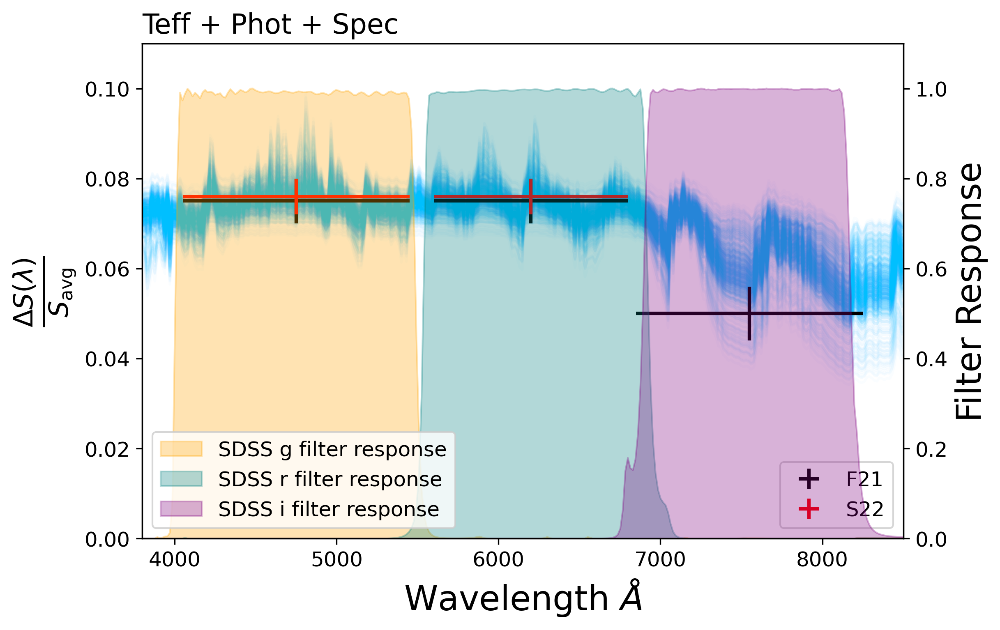

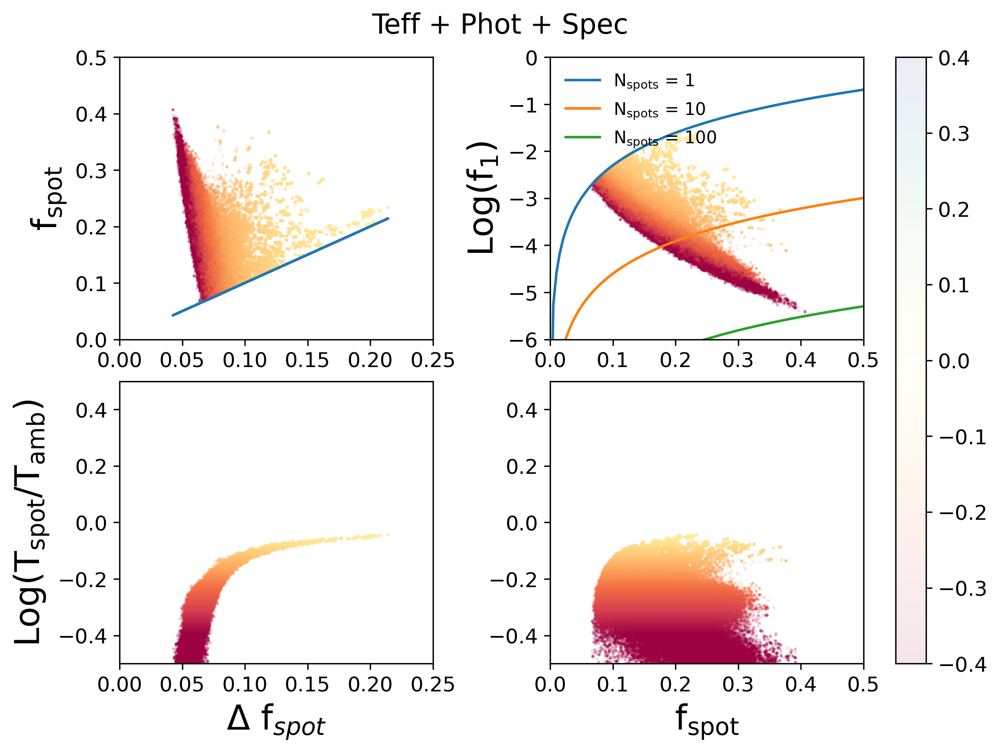

/var/folders/vq/zxq380ws52q37mjjtbt9c7rh0000gp/T/ipykernel_76876/2877115387.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, [ax0,ax1] = plt.subplots(2,1,figsize=(8,5),sharex=True,gridspec_kw=dict(height_ratios=[1,0.3]))
/Users/wiwa8630/opt/anaconda3/envs/the-lab/lib/python3.9/site-packages/corner/core.py:103: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.subplots_adjust(


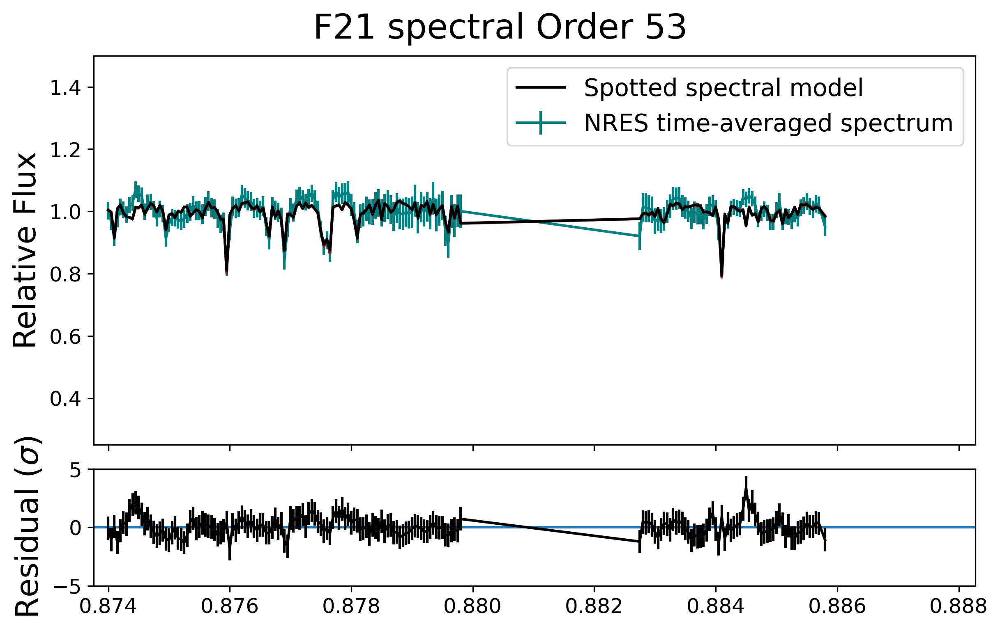

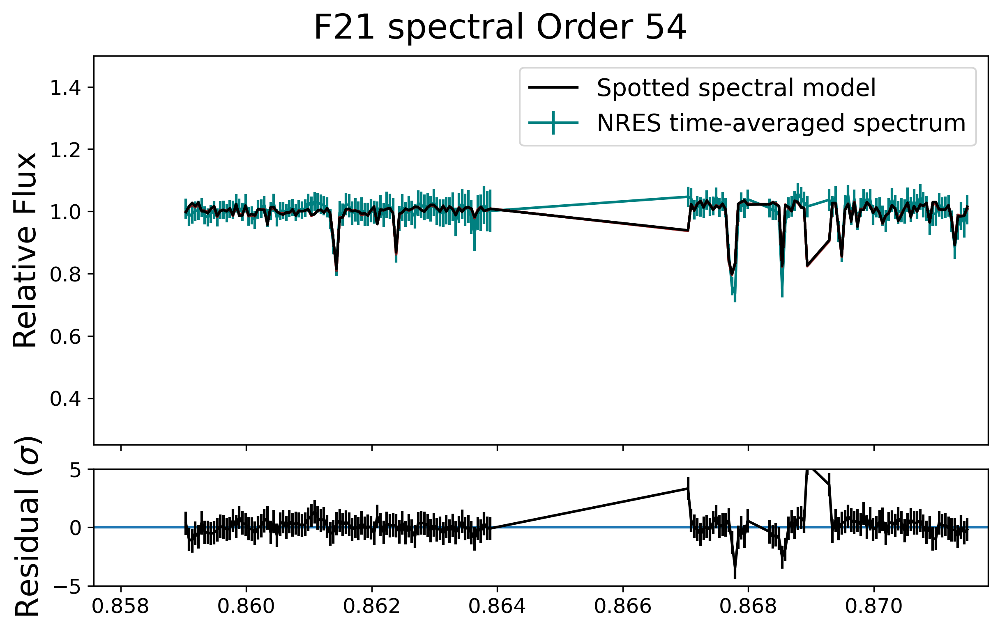

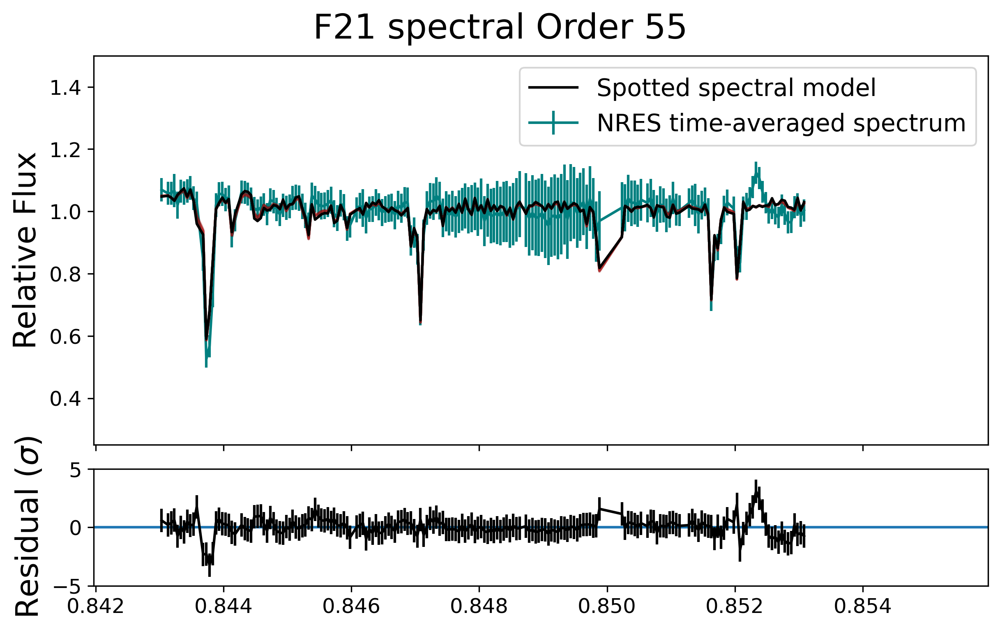

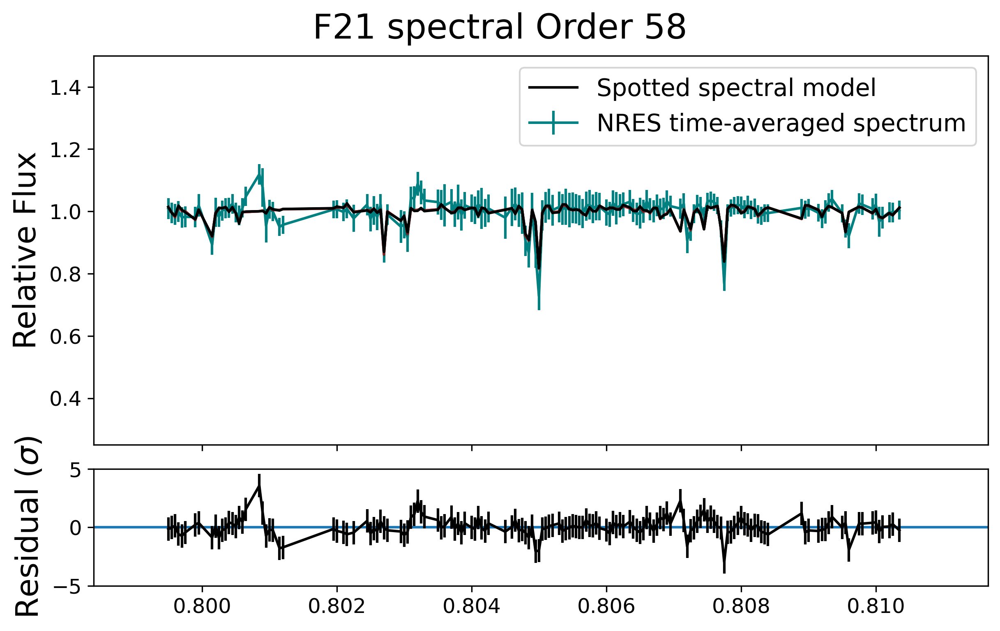

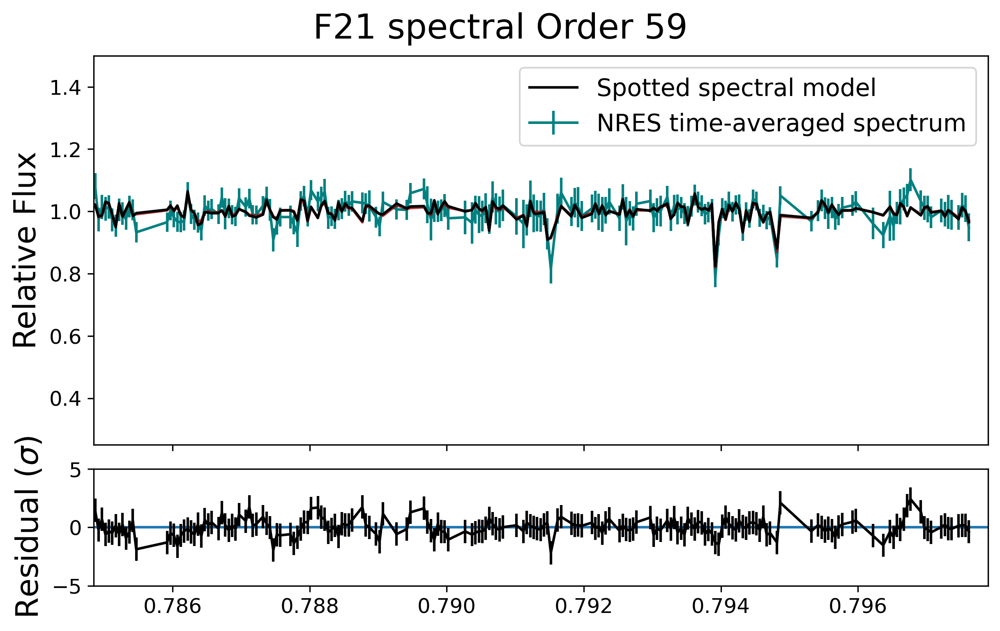

...

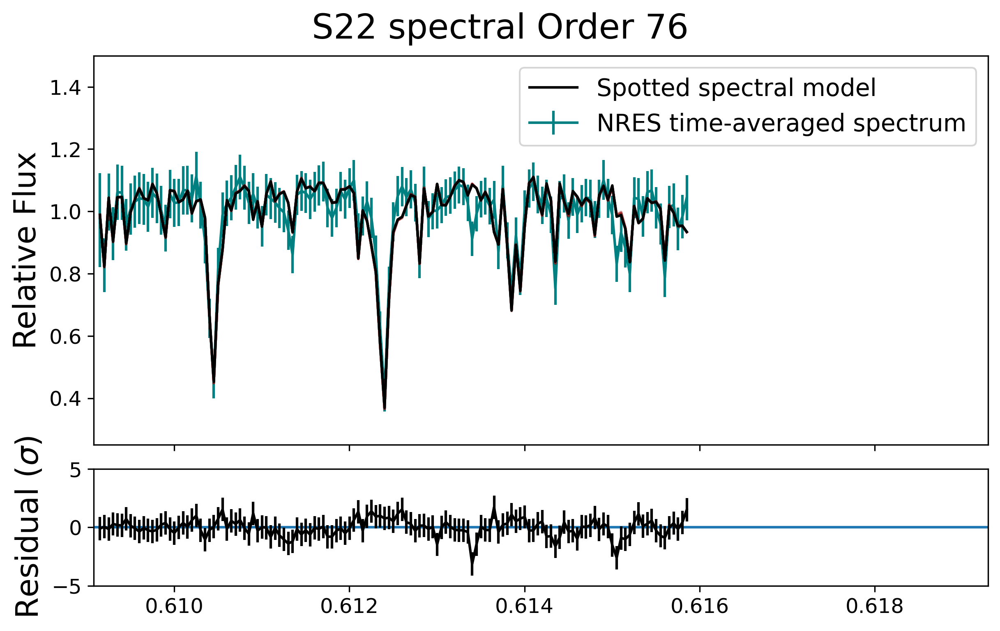

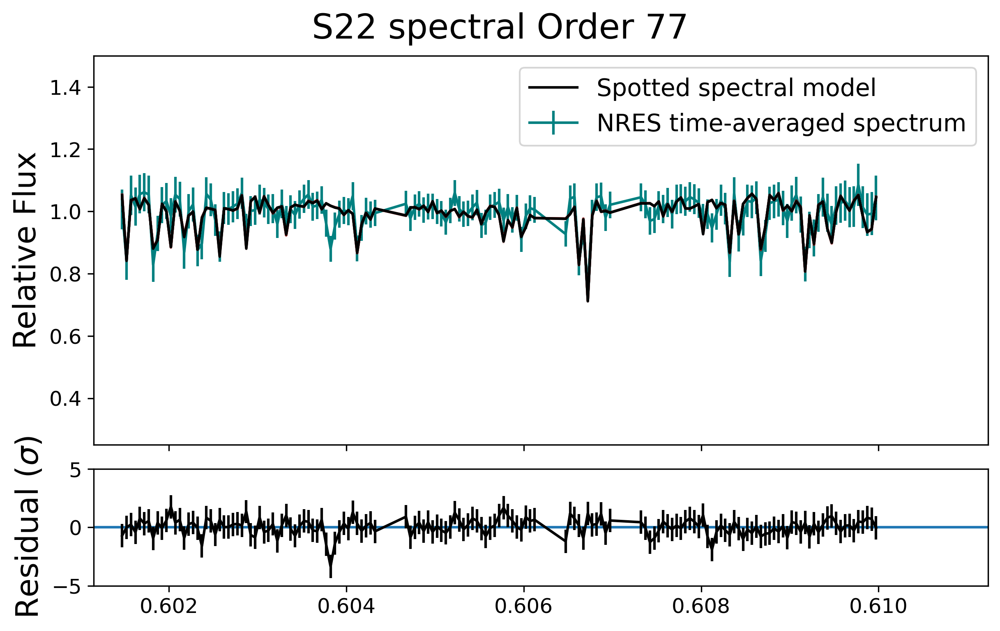

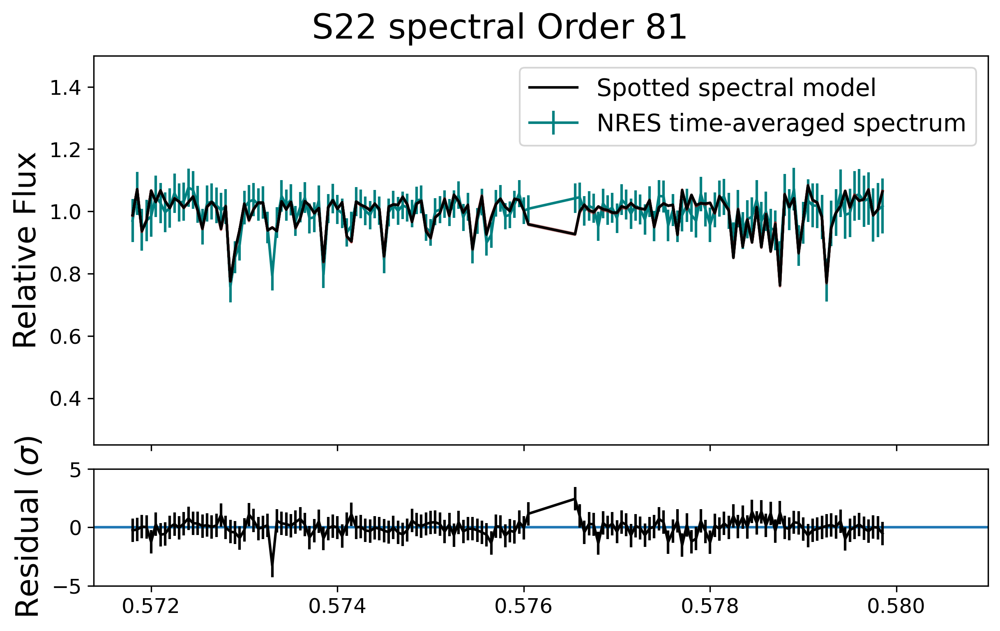

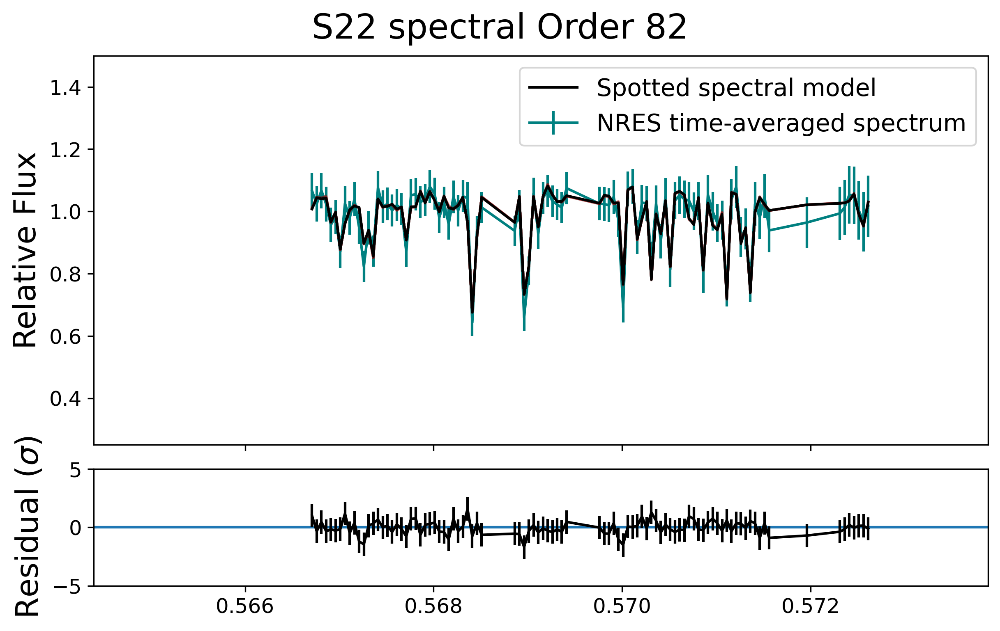

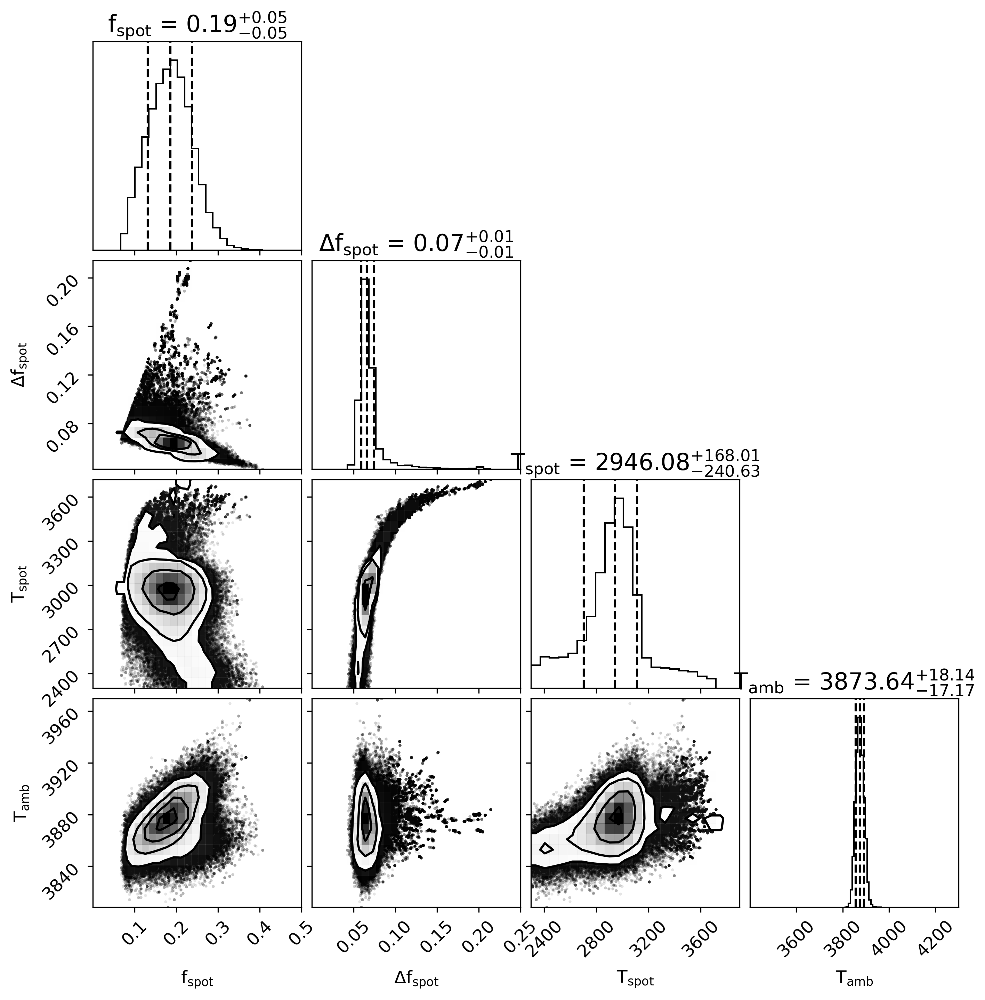

In [63]:
# Ensemble PLOTS
samples=ensemble_model_samples
nsteps=4000
title = 'Teff + Phot + Spec'
label = 'full_ensemble_4000steps'

fspot_sam, dfspot_sam, Tspot_sam, Tamb_sam = samples
sig1_fspot = np.percentile(fspot_sam, [15.9, 50., 84.1]) # central 1-sigma values
sig1_dfspot = np.percentile(dfspot_sam, [15.9, 50., 84.1])
sig1_Tspot = np.percentile(Tspot_sam, [15.9, 50., 84.1])
sig1_Tamb = np.percentile(Tamb_sam, [15.9, 50., 84.1])
best_params = np.array([sig1_fspot[1], sig1_dfspot[1], sig1_Tspot[1], sig1_Tamb[1]])
variable_names = [r'f$_{\rm{spot}}$',r'$\Delta$f$_{\rm{spot}}$',r'T$_{\rm{spot}}$',r'T$_{\rm{amb}}$']

photometric_variability_model(parameters=best_params,
                              plot=True,samples_exist=True,
                              samples=samples,label=label,title=title)

# Plot samples
fig, axs = plt.subplots(2,2,figsize=(8,6))
fig.suptitle(f'{title}',fontsize=16)
ax1 = axs[0,0]
ax2 = axs[1,0]
ax3 = axs[0,1]
ax4 = axs[1,1]
colmap = 'Spectral'
# plot dfspot vs fspot
ax1.scatter(dfspot_sam,fspot_sam,c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax1.plot(dfspot_sam,dfspot_sam)
ax1.set_ylabel(r'f$_{\rm{spot}}$',fontsize=20)
ax1.set_ylim(0,0.5)
ax1.set_xlim(0,0.25)
# plot dfspot vs log(Tspot/Tamb)
ax2.scatter(dfspot_sam,np.log(Tspot_sam/Tamb_sam),c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax2.set_xlabel(r'$\Delta$ f$_{spot}$',fontsize=20)
ax2.set_ylabel(r'Log(T$_{\rm{spot}}$/T$_{\rm{amb}}$)',fontsize=20)
ax2.set_xlim(0,0.25)
ax2.set_ylim(-.5,0.5)
# plot fspot vs log(f1), the filling factor of 1 spot
top_right_plot = ax3.scatter(fspot_sam,np.log(dfspot_sam**2/fspot_sam),
                                c=np.log(Tspot_sam/Tamb_sam),cmap=colmap,
                                alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)),label=r'N$_{\rm{spots}}$ = 1')
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)/10),label=r'N$_{\rm{spots}}$ = 10')
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)/100),label=r'N$_{\rm{spots}}$ = 100')
ax3.set_xlim(0,0.5)
ax3.set_ylim(-6,0)
ax3.set_ylabel(r'Log(f$_1$)',fontsize=20)
ax3.legend(loc='upper left',frameon=False,fontsize='10')
fig.colorbar(top_right_plot, ax=axs[:, 1])
# plot fspot vs log(Tspot/Tamb)
ax4.scatter(fspot_sam,np.log(Tspot_sam/Tamb_sam),c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax4.set_ylim(-.5,0.5)
ax4.set_xlim(0,0.5)
ax4.set_xlabel(r'f$_{\rm{spot}}$',fontsize=20)
# ax4.set_ylabel(r'Log(T$_{\rm{spot}}$/T$_{\rm{amb}}$)',fontsize=20)

plt.savefig(f'../figs/{label}_samples.png',dpi=200)
plt.show()
plt.close()

#plot the spectra
for visit in ['F21','S22']:
    for order in good_orders:
        _wave = NRES_Spectra[f'{visit}'][f'{order}']['w']
        ref_wave = NRES_Spectra[f'{visit}'][f'{order}']['ref_w']
        _flux = NRES_Spectra[f'{visit}'][f'{order}']['f']
        _err = NRES_Spectra[f'{visit}'][f'{order}']['e']
        
        spec_label = f'{visit}_{order}_'+label

        average_spectrum_model(data_flux=_flux, data_err=_err,
                               wavelength=_wave,plot=True,ref_w =ref_wave,
                               samples_exist=True,samples=specsamples,
                               label=spec_label,title=f'{visit} spectral Order {order}')

#make the corner plot
figure = corner.corner(samples.T, labels=variable_names,
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 16})

# Extract the axes, loop through to set all the limits
axes = np.array(figure.axes).reshape((4, 4))
for yi in range(4):
    ax = axes[yi, 0]
    ax.set_xlim(0,0.5)
    ax = axes[yi, 1]
    ax.set_xlim(0,0.25)
    ax = axes[yi, 2]
    ax.set_xlim(2300,3900)
    ax = axes[yi, 3]
    ax.set_xlim(3400,4300)
plt.savefig(f'../figs/{label}_corner.png',dpi=200)
plt.show()

# Violin plot of final posteriors

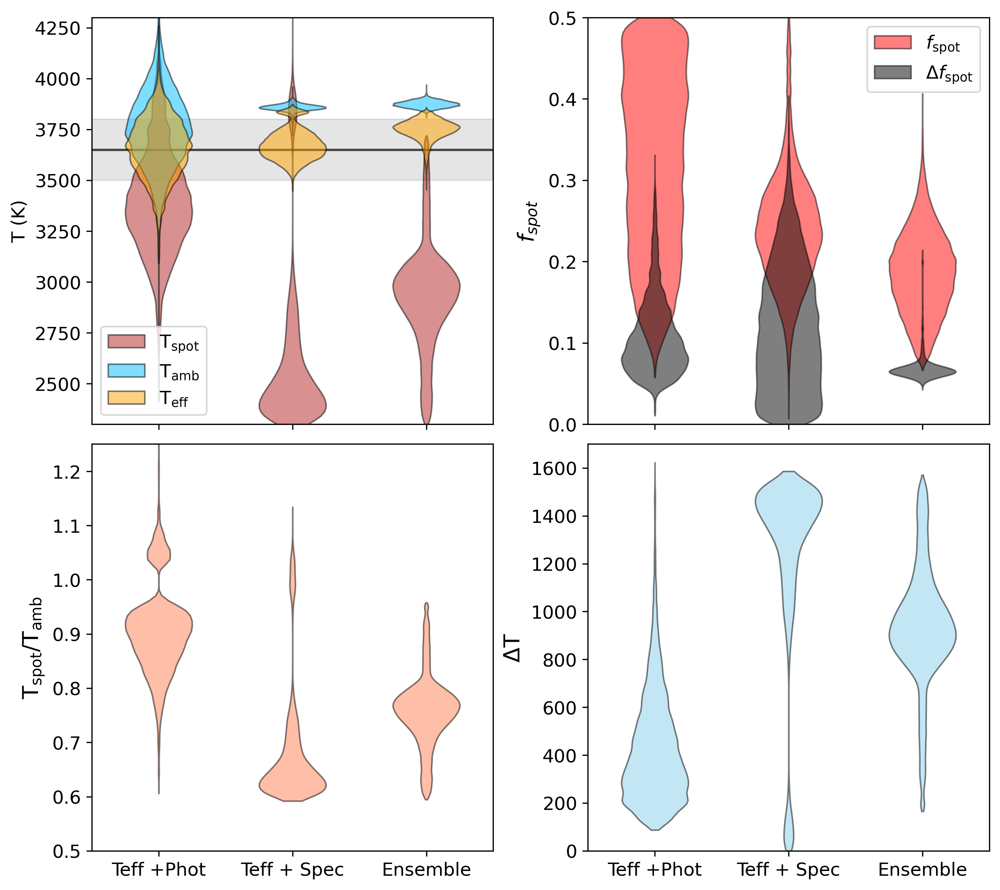

In [64]:
params = {'legend.fontsize': 'large',
         'axes.labelsize': 'large',
         'axes.titlesize':'large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'large'}
plt.rcParams.update(params)
 
nsteps = [2000, 2000, 4000]
visitlabels = ['Teff +Phot','Teff + Spec', 'Ensemble']
ordernumbers = np.array([1,2,3])
labels = ['Teff_Phot','Teff_Spec','full_ensemble']
        
fig, ax = plt.subplots(2,2,figsize=(9,8),sharex=True)
ax[0,0].set_ylim(2300,4300)
ax[0,0].set_ylabel('T (K)')
ax[0,0].axhspan(3500,3800,color='gray',alpha=0.2,zorder=-100) 
ax[0,0].axhline(3650,color='k',alpha=0.7,zorder=-99)

ax[1,0].set_ylabel(r'$\rm{T_{spot}/T_{amb}}$',fontsize='x-large')
ax[1,0].set_ylim(0.5,1.25)
ax[1,0].set_xticks(ordernumbers, visitlabels)

ax[1,1].set_ylabel(r'$\Delta$T',fontsize='x-large')
ax[1,1].set_ylim(0,1700)    
ax[1,1].set_xticks(ordernumbers, visitlabels)

ax[0,1].set_xlim(0.5,3.5)
ax[0,1].set_ylim(0,0.5)
ax[0,1].set_ylabel('$f_{spot}$',fontsize='x-large')

j=0
for ordernum in ordernumbers:
    l = ordernum - 1
    c11 = 'firebrick'
    c12 = 'deepskyblue'
    c13 = 'orange'
    c21 = 'coral'
    c31 = 'skyblue'
    c41 = 'red'
    c42 = 'black'
    alpha = 0.5

    reader = emcee.backends.HDFBackend(f'../data/samples/{labels[j]}_{nsteps[j]}steps.h5')
    sampler = reader.get_chain(discard=int(0.25*nsteps[j]), flat=True)
    samples = sampler.reshape((-1, 4)).T
    fspots = samples[0] 
    dfspots = samples[1]
    t_spot = samples[2]
    t_amb = samples[3]
    t_eff = (fspots*(t_spot**4) + (1-fspots)*(t_amb**4))**(1/4)
    t_ratio = t_spot/t_amb
    delta_t = np.abs(t_amb-t_spot)

    Tspots = ax[0,0].violinplot(t_spot, positions=[ordernumbers[j]],showextrema=False, showmedians=False)
    Tambs = ax[0,0].violinplot(t_amb, positions=[ordernumbers[j]],showextrema=False, showmedians=False)
    Teffs = ax[0,0].violinplot(t_eff, positions=[ordernumbers[j]],showextrema=False, showmedians=False)
    for pc in Tambs['bodies']:
        if l == 0: 
            pc.set_label(r'$\rm{T_{amb}}$')
        pc.set_facecolor(c12)
        pc.set_edgecolor('black')
        pc.set_alpha(alpha)
    for pc in Teffs['bodies']:
        if l == 0: 
            pc.set_label(r'$\rm{T_{eff}}$')
        pc.set_facecolor(c13)
        pc.set_edgecolor('black')
        pc.set_alpha(alpha)
    for pc in Tspots['bodies']:
        pc.set_facecolor(c11)
        if j == 0:
            if l == 0: 
                pc.set_label(r'$\rm{T_{spot}}$')
        pc.set_edgecolor('black')
        pc.set_alpha(alpha)

    ratios = ax[1,0].violinplot(t_ratio, positions=[ordernumbers[j]],showextrema=False, showmedians=False)
    for pc in ratios['bodies']:
        pc.set_facecolor(c21)
        pc.set_edgecolor('black')
        pc.set_alpha(alpha)

    deltas = ax[1,1].violinplot(delta_t, positions=[ordernumbers[j]],showextrema=False, showmedians=False)
    for pc in deltas['bodies']:
        pc.set_facecolor(c31)
        pc.set_edgecolor('black')
        pc.set_alpha(alpha)

    fspots = ax[0,1].violinplot(fspots, positions=[ordernumbers[j]],showextrema=False, showmedians=False)
    for pc in fspots['bodies']:
        if l == 0: 
            pc.set_label(r'$f_{\rm{spot}}$')
        pc.set_facecolor(c41)
        pc.set_edgecolor('black')
        pc.set_alpha(alpha)
    dfspots = ax[0,1].violinplot(dfspots, positions=[ordernumbers[j]],showextrema=False, showmedians=False)
    for pc in dfspots['bodies']:
        if l == 0: 
            pc.set_label(r'$\Delta f_{\rm{spot}}$')
        pc.set_facecolor(c42)
        pc.set_edgecolor('black')
        pc.set_alpha(alpha)
        
    j+=1
        
ax[0,0].legend(loc='lower left')
ax[0,1].legend()
# ax[1,0].legend()
# ax[1,1].legend()

    
plt.savefig(f'../figs/ensemble_violin.png',dpi=400)
plt.show()

# Plot Contamination

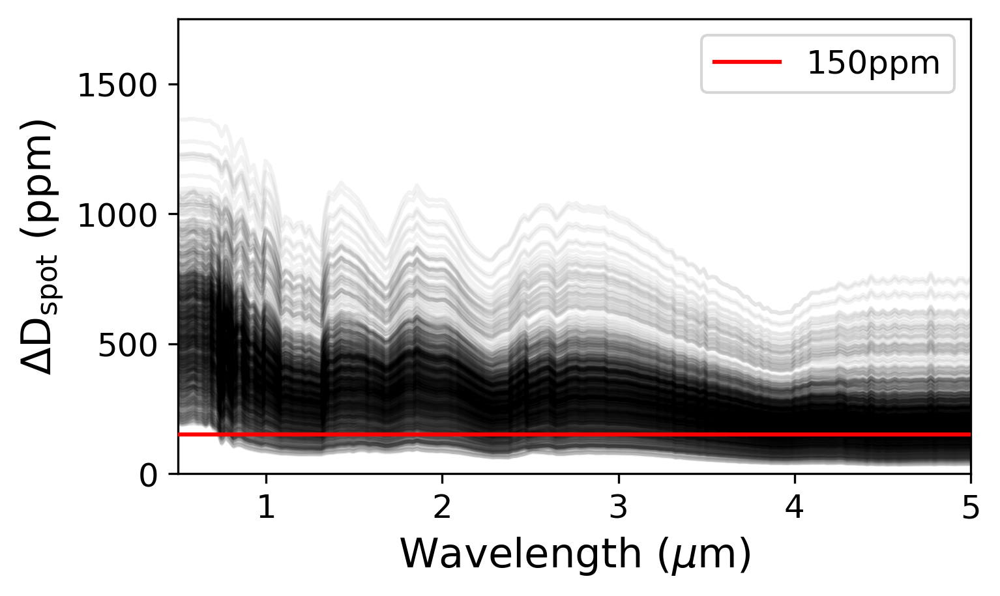

In [65]:
transit_depth = (0.0512)**2.

samples=ensemble_model_samples
nsteps=4000
title = 'Teff + Phot + Spec'
label = 'full_ensemble_4000steps'
fspot_sam, dfspot_sam, Tspot_sam, Tamb_sam = samples
variable_names = [r'f$_{\rm{spot}}$',r'$\Delta$f$_{\rm{spot}}$',r'T$_{\rm{spot}}$',r'T$_{\rm{amb}}$']

"""
Now we will plot samples from the posteriors
"""
wavelength=np.linspace(0.5,5,200)*u.micron
plt.figure(figsize=(5,3))
# title_label=f'{visit} Order {order} {modelname}'
# plt.title(title_label,fontsize=16,loc='left')        
plt.ylabel(r'$\Delta \rm D_{spot}$ (ppm)',fontsize=15)
plt.xlabel(r'Wavelength ($\mu$m)',fontsize=15)
plt.ylim(0,1750)
plt.xlim(0.5,5)
# plt.axhline(0.02*transit_depth*1e6,color='white',label='1 Scale Height',linestyle='--',zorder=1000)
# plt.axhline(1.0,color='k',label='Opaque transit depth')
for k in range(0,1000):
    j = np.random.randint(low=0,high=(len(Tspot_sam)-1))
    s_spot = get_phoenix_photons(temperature=Tspot_sam[j], wavelength = wavelength,
                                                   logg=4.4, metallicity=0.0)
    s_amb = get_phoenix_photons(temperature=Tamb_sam[j], wavelength = wavelength,
                                                   logg=4.4, metallicity=0.0)
    flux_ratio = s_spot[1]/s_amb[1]
    top = 1.
    bottom = (1. - fspot_sam[j]) + fspot_sam[j] * flux_ratio
    delta_D_spot = ((top / bottom) - 1.) * transit_depth
    depth_factor = (delta_D_spot/transit_depth) + 1.

    rand_Tspot = np.random.uniform(2500.0, 4400.0)
    rand_fspot = np.random.uniform(0.01,0.5)
    rand_df = np.random.uniform(0.005,rand_fspot)
    rand_Tamb = ( (3700.0**4 - rand_fspot*rand_Tspot**4) / (1-rand_fspot) )**(1/4)

    if rand_Tamb <= 2300.0:
        rand_Tamb = 2301.0
    _s_spot = get_phoenix_photons(temperature=rand_Tspot, wavelength = wavelength,
                                                   logg=4.4, metallicity=0.0)
    _s_amb = get_phoenix_photons(temperature=rand_Tamb, wavelength = wavelength,
                                                   logg=4.4, metallicity=0.0)
    _flux_ratio = _s_spot[1]/_s_amb[1]
    _top = 1.
    _bottom = (1. - rand_fspot) + rand_fspot * _flux_ratio
    _delta_D_spot = ((_top / _bottom) - 1.) * transit_depth
    _depth_factor = (_delta_D_spot/transit_depth) + 1.

    plt.plot(s_spot[0],(depth_factor-1)*transit_depth*1e6,color = 'k',alpha=0.05,zorder=100) # this will be the input wavelength from the order in question
    # plt.plot(s_spot[0],(_depth_factor-1)*transit_depth*1e6,color = 'k',alpha=0.1,zorder=-100) # this will be the input wavelength from the order in question
plt.axhline(150,color='red',label='150ppm',zorder=1000)
plt.legend(loc = 'upper right')
plt.savefig(f'../figs/final_contamination.png',dpi=200)
plt.show()
plt.close()